In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
import pandas_profiling
import seaborn as sns
import itertools
import warnings
from statsmodels.stats.outliers_influence import variance_inflation_factor
import statsmodels.formula.api as smf
from patsy import dmatrices

In [3]:
from sklearn import metrics
from sklearn.model_selection import cross_val_score
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2, f_classif, mutual_info_classif
from sklearn.feature_selection import RFE
from sklearn.feature_selection import f_regression
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression

In [4]:
data=pd.read_excel('Data Set.xlsx')

In [5]:
data.head()

,custid,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,...,owncd,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03
0,3964-QJWTRG-NPN,1,2.0,1,20,2,September,15,3,1,...,0,0,0,1,1,0,0,0,1,0
1,0648-AIPJSP-UVM,5,5.0,0,22,2,May,17,4,2,...,1,1,1,1,1,1,1,0,0,0
2,5195-TLUDJE-HVO,3,4.0,1,67,6,June,14,2,2,...,1,0,0,0,0,0,1,0,0,0
3,4459-VLPQUH-3OL,4,3.0,0,23,2,May,16,3,2,...,1,0,1,1,1,0,1,1,0,0
4,8158-SMTQFB-CNO,2,2.0,0,26,3,July,16,3,2,...,1,0,1,0,1,0,0,0,1,0


In [6]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
region,5000.0,3.001400,1.421760,1.000000,2.000000,3.000000,4.000000,5.000000
townsize,4998.0,2.687275,1.425925,1.000000,1.000000,3.000000,4.000000,5.000000
gender,5000.0,0.503600,0.500037,0.000000,0.000000,1.000000,1.000000,1.000000
age,5000.0,47.025600,17.770338,18.000000,31.000000,47.000000,62.000000,79.000000
agecat,5000.0,4.238800,1.308785,2.000000,3.000000,4.000000,5.000000,6.000000
ed,5000.0,14.543000,3.281083,6.000000,12.000000,14.000000,17.000000,23.000000
edcat,5000.0,2.672000,1.211738,1.000000,2.000000,2.000000,4.000000,5.000000
jobcat,5000.0,2.752800,1.737900,1.000000,1.000000,2.000000,4.000000,6.000000
union,5000.0,0.151200,0.358280,0.000000,0.000000,0.000000,0.000000,1.000000
employ,5000.0,9.730400,9.690929,0.000000,2.000000,7.000000,15.000000,52.000000


In [7]:
data['Total_Spend']=data.cardspent+data.card2spent
data.drop(['cardspent','card2spent'],axis=1,inplace=True)

In [8]:
pandas_profiling.ProfileReport(data)

### By the help of pandas profiling:-
- Dropping Variables >25% missings
- Dropping highly correlated variables

Dropping Variables - address,age,cardtenure,card2tenure,card2tenurecat,commute,ed,equipmon,lncardmon,lncardten,lnequipmon,
                     lnequipten,lninc,lnlongmon,lntollmon,lntollten,longten,spoused,spousedcat,lnlongten,lnwiremon

In [9]:
data.drop(['address','age','cardtenure','card2tenure','card2tenurecat','commute','ed','equipmon','lncardmon','lncardten','lnequipmon','lnequipten','lninc','lnlongmon','lntollmon','lntollten','longten','spoused','spousedcat','lnlongten','lnwiremon'],axis=1,inplace=True)

# Check normal distribution

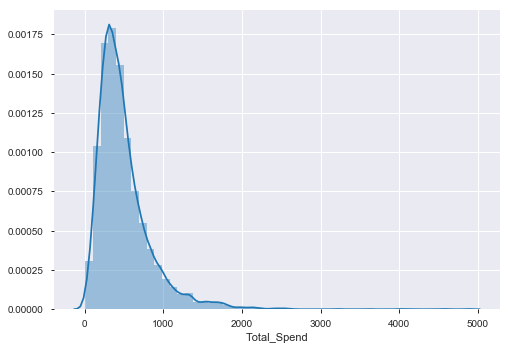

In [10]:
sns.distplot(data.Total_Spend)

In [11]:
data['log_Total_Spend']=np.log(data['Total_Spend'])

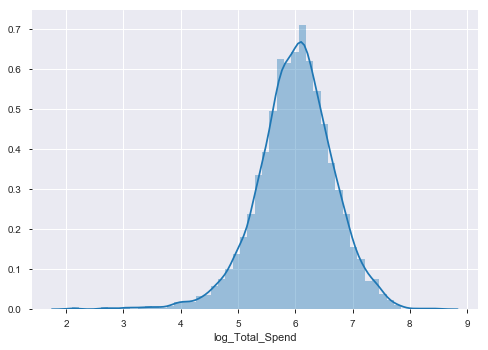

In [12]:
sns.distplot(data.log_Total_Spend)
data=data.drop(['Total_Spend'],axis=1)

In [13]:
numeric_var_names=[key for key in dict(data.dtypes) if dict(data.dtypes)[key] in ['float64', 'int64', 'float32', 'int32']]
cat_var_names=[key for key in dict(data.dtypes) if dict(data.dtypes)[key] in ['object', 'O']]

In [14]:
numeric_var_names

['region',
 'townsize',
 'gender',
 'agecat',
 'edcat',
 'jobcat',
 'union',
 'employ',
 'empcat',
 'retire',
 'income',
 'inccat',
 'debtinc',
 'creddebt',
 'lncreddebt',
 'othdebt',
 'lnothdebt',
 'default',
 'jobsat',
 'marital',
 'reside',
 'pets',
 'pets_cats',
 'pets_dogs',
 'pets_birds',
 'pets_reptiles',
 'pets_small',
 'pets_saltfish',
 'pets_freshfish',
 'homeown',
 'hometype',
 'addresscat',
 'cars',
 'carown',
 'cartype',
 'carvalue',
 'carcatvalue',
 'carbought',
 'carbuy',
 'commutecat',
 'commutetime',
 'commutecar',
 'commutemotorcycle',
 'commutecarpool',
 'commutebus',
 'commuterail',
 'commutepublic',
 'commutebike',
 'commutewalk',
 'commutenonmotor',
 'telecommute',
 'reason',
 'polview',
 'polparty',
 'polcontrib',
 'vote',
 'card',
 'cardtype',
 'cardbenefit',
 'cardfee',
 'cardtenurecat',
 'card2',
 'card2type',
 'card2benefit',
 'card2fee',
 'active',
 'bfast',
 'tenure',
 'churn',
 'longmon',
 'tollfree',
 'tollmon',
 'tollten',
 'equip',
 'equipten',
 'callca

In [15]:
cat_var_names
#custid is not important.

['custid', 'birthmonth']

In [16]:
data_cat=pd.DataFrame()
data_cat['birth_cat']=np.where((data["birthmonth"]=='January'),1,
                               np.where((data["birthmonth"]=='February'),2,
                                        np.where((data["birthmonth"]=='March'),3,
                                                 np.where((data["birthmonth"]=='April'),4,
                                                          np.where((data["birthmonth"]=='May'),5,
                                                                   np.where((data["birthmonth"]=='June'),6,
                                                                            np.where((data["birthmonth"]=='July'),7,
                                                                                     np.where((data["birthmonth"]=='August'),8,
                                                                                              np.where((data["birthmonth"]=='September'),9,
                                                                                                       np.where((data["birthmonth"]=='October'),10,
                                                                                                                np.where((data["birthmonth"]=='November'),11,
                                                                                                                         np.where((data["birthmonth"]=='December'),12,0))))))))))))
data_cat.head()

,birth_cat
0,9
1,5
2,6
3,5
4,7


# Handling Outlier

In [18]:
data_num=data[numeric_var_names]

#Handling Outliers
def outlier_capping(x):
    x = x.clip(upper=x.quantile(0.99))
    x = x.clip(lower=x.quantile(0.01))
    return x


data_num=data_num.apply(outlier_capping)

# Handling Missing in Numerical Variables

In [19]:
#Handling missings
def Missing_imputation(x):
    x = x.fillna(x.median())
    return x

data_num=data_num.apply(Missing_imputation)

# Handling Missing in Categorical Variables

In [20]:
data_cat=data_cat.fillna(data_cat.mode())

In [21]:
data_log_Total_Spend = data_num['log_Total_Spend']
data_num=data_num[data_num.columns.difference(['log_Total_Spend'])]
data_num.head(5)

,active,addresscat,agecat,bfast,callcard,callid,callwait,carbought,carbuy,carcatvalue,...,tollfree,tollmon,tollten,townsize,union,voice,vote,wireless,wiremon,wireten
0,0.0,1.0,2.0,3.0,1.0,0.0,1.0,0.0,0.0,1.0,...,1.0,29.0,161.05,2.0,1.0,1.0,1.0,0.0,0.00,0.00
1,1.0,1.0,2.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.00,5.0,0.0,1.0,0.0,1.0,45.65,1683.55
2,0.0,5.0,6.0,3.0,1.0,0.0,0.0,0.0,1.0,1.0,...,0.0,0.0,0.00,4.0,0.0,0.0,0.0,0.0,0.00,0.00
3,1.0,2.0,2.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,...,0.0,0.0,0.00,3.0,0.0,0.0,0.0,0.0,0.00,0.00
4,1.0,2.0,3.0,3.0,1.0,1.0,1.0,0.0,1.0,1.0,...,1.0,16.5,387.70,2.0,0.0,1.0,0.0,1.0,19.05,410.80


# Data Audit Report

In [22]:
# Creating Data audit Report
def var_summary(x):
    return pd.Series([x.count(), x.isnull().sum(), x.sum(), x.mean(), x.median(),  x.std(), x.var(), x.std()/x.mean(), x.min(), x.dropna().quantile(0.01), x.dropna().quantile(0.05),x.dropna().quantile(0.10),x.dropna().quantile(0.25),x.dropna().quantile(0.50),x.dropna().quantile(0.75), x.dropna().quantile(0.90),x.dropna().quantile(0.95), x.dropna().quantile(0.99),x.max()], 
                  index=['N', 'NMISS', 'SUM', 'MEAN','MEDIAN', 'STD', 'VAR', 'CV','MIN', 'P1' , 'P5' ,'P10' ,'P25' ,'P50' ,'P75' ,'P90' ,'P95' ,'P99' ,'MAX'])

data_num.apply(var_summary).T

,N,NMISS,SUM,MEAN,MEDIAN,STD,VAR,CV,MIN,P1,P5,P10,P25,P50,P75,P90,P95,P99,MAX
active,5000.0,0.0,2330.000,0.466000,0.00,0.498893,0.248894,1.070585,0.0,0.0,0.0,0.00,0.0,0.00,1.0000,1.000,1.0000,1.000000,1.0000
addresscat,5000.0,0.0,16360.000,3.272000,3.00,1.319987,1.742364,0.403419,1.0,1.0,1.0,1.00,2.0,3.00,4.0000,5.000,5.0000,5.000000,5.0000
agecat,5000.0,0.0,21194.000,4.238800,4.00,1.308785,1.712917,0.308763,2.0,2.0,2.0,2.00,3.0,4.00,5.0000,6.000,6.0000,6.000000,6.0000
bfast,5000.0,0.0,10293.000,2.058600,2.00,0.829520,0.688104,0.402954,1.0,1.0,1.0,1.00,1.0,2.00,3.0000,3.000,3.0000,3.000000,3.0000
callcard,5000.0,0.0,3581.000,0.716200,1.00,0.450886,0.203298,0.629553,0.0,0.0,0.0,0.00,0.0,1.00,1.0000,1.000,1.0000,1.000000,1.0000
callid,5000.0,0.0,2376.000,0.475200,0.00,0.499435,0.249435,1.050999,0.0,0.0,0.0,0.00,0.0,0.00,1.0000,1.000,1.0000,1.000000,1.0000
callwait,5000.0,0.0,2395.000,0.479000,0.00,0.499609,0.249609,1.043025,0.0,0.0,0.0,0.00,0.0,0.00,1.0000,1.000,1.0000,1.000000,1.0000
carbought,5000.0,0.0,1105.000,0.221000,0.00,0.609125,0.371033,2.756222,-1.0,-1.0,-1.0,0.00,0.0,0.00,1.0000,1.000,1.0000,1.000000,1.0000
carbuy,5000.0,0.0,1805.000,0.361000,0.00,0.480339,0.230725,1.330578,0.0,0.0,0.0,0.00,0.0,0.00,1.0000,1.000,1.0000,1.000000,1.0000
carcatvalue,5000.0,0.0,6947.000,1.389400,1.00,1.081296,1.169201,0.778247,-1.0,-1.0,-1.0,1.00,1.0,1.00,2.0000,3.000,3.0000,3.000000,3.0000


In [23]:
num_summary=data_num.apply(var_summary).T
num_summary.to_csv('num_summary.csv')

In [24]:
data_num=data_num.loc[:,(data_num.var()>0.1)]
data_num.head()


,active,addresscat,agecat,bfast,callcard,callid,callwait,carbought,carbuy,carcatvalue,...,tollfree,tollmon,tollten,townsize,union,voice,vote,wireless,wiremon,wireten
0,0.0,1.0,2.0,3.0,1.0,0.0,1.0,0.0,0.0,1.0,...,1.0,29.0,161.05,2.0,1.0,1.0,1.0,0.0,0.00,0.00
1,1.0,1.0,2.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.00,5.0,0.0,1.0,0.0,1.0,45.65,1683.55
2,0.0,5.0,6.0,3.0,1.0,0.0,0.0,0.0,1.0,1.0,...,0.0,0.0,0.00,4.0,0.0,0.0,0.0,0.0,0.00,0.00
3,1.0,2.0,2.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,...,0.0,0.0,0.00,3.0,0.0,0.0,0.0,0.0,0.00,0.00
4,1.0,2.0,3.0,3.0,1.0,1.0,1.0,0.0,1.0,1.0,...,1.0,16.5,387.70,2.0,0.0,1.0,0.0,1.0,19.05,410.80


In [25]:
data_new = pd.concat([data_num,data_cat],axis=1)
data_new.head()

,active,addresscat,agecat,bfast,callcard,callid,callwait,carbought,carbuy,carcatvalue,...,tollmon,tollten,townsize,union,voice,vote,wireless,wiremon,wireten,birth_cat
0,0.0,1.0,2.0,3.0,1.0,0.0,1.0,0.0,0.0,1.0,...,29.0,161.05,2.0,1.0,1.0,1.0,0.0,0.00,0.00,9
1,1.0,1.0,2.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,...,0.0,0.00,5.0,0.0,1.0,0.0,1.0,45.65,1683.55,5
2,0.0,5.0,6.0,3.0,1.0,0.0,0.0,0.0,1.0,1.0,...,0.0,0.00,4.0,0.0,0.0,0.0,0.0,0.00,0.00,6
3,1.0,2.0,2.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,...,0.0,0.00,3.0,0.0,0.0,0.0,0.0,0.00,0.00,5
4,1.0,2.0,3.0,3.0,1.0,1.0,1.0,0.0,1.0,1.0,...,16.5,387.70,2.0,0.0,1.0,0.0,1.0,19.05,410.80,7


In [26]:
# Variable reduction on the basis of correlation metrics(correlation coefficent>0.6)
def correlation(dataset, threshold):
    col_corr = set() # Set of all the names of deleted columns
    corr_matrix = dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if (corr_matrix.iloc[i, j] >= threshold) and (corr_matrix.columns[j] not in col_corr):
                colname = corr_matrix.columns[i] # getting the name of column
                col_corr.add(colname)
                if colname in dataset.columns:
                    del dataset[colname] # deleting the column from the dataset


correlation(data_new, 0.6)

In [27]:
data_new.head()

,active,addresscat,bfast,callcard,callid,carbought,carbuy,carcatvalue,card,card2,...,response_02,retire,telecommute,tollten,townsize,union,voice,vote,wireten,birth_cat
0,0.0,1.0,3.0,1.0,0.0,0.0,0.0,1.0,3.0,5.0,...,1.0,0.0,0.0,161.05,2.0,1.0,1.0,1.0,0.00,9
1,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,2.0,4.0,...,0.0,0.0,1.0,0.00,5.0,0.0,1.0,0.0,1683.55,5
2,0.0,5.0,3.0,1.0,0.0,0.0,1.0,1.0,2.0,4.0,...,0.0,0.0,0.0,0.00,4.0,0.0,0.0,0.0,0.00,6
3,1.0,2.0,1.0,1.0,0.0,0.0,1.0,1.0,2.0,3.0,...,0.0,0.0,0.0,0.00,3.0,0.0,0.0,0.0,0.00,5
4,1.0,2.0,3.0,1.0,1.0,0.0,1.0,1.0,4.0,1.0,...,1.0,0.0,0.0,387.70,2.0,0.0,1.0,0.0,410.80,7


In [28]:
data_new=pd.concat([data_new,data_log_Total_Spend],axis=1)
data_new = data_new.replace([np.inf, -np.inf], np.nan).dropna(axis=0)
data_new.head()

,active,addresscat,bfast,callcard,callid,carbought,carbuy,carcatvalue,card,card2,...,retire,telecommute,tollten,townsize,union,voice,vote,wireten,birth_cat,log_Total_Spend
0,0.0,1.0,3.0,1.0,0.0,0.0,0.0,1.0,3.0,5.0,...,0.0,0.0,161.05,2.0,1.0,1.0,1.0,0.00,9,5.007029
1,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,2.0,4.0,...,0.0,1.0,0.00,5.0,0.0,1.0,0.0,1683.55,5,4.350794
2,0.0,5.0,3.0,1.0,0.0,0.0,1.0,1.0,2.0,4.0,...,0.0,0.0,0.00,4.0,0.0,0.0,0.0,0.00,6,5.886021
3,1.0,2.0,1.0,1.0,0.0,0.0,1.0,1.0,2.0,3.0,...,0.0,0.0,0.00,3.0,0.0,0.0,0.0,0.00,5,5.884464
4,1.0,2.0,3.0,1.0,1.0,0.0,1.0,1.0,4.0,1.0,...,0.0,0.0,387.70,2.0,0.0,1.0,0.0,410.80,7,6.230147


# Feature Selection based on importance using F-Regression

In [29]:
# Feature Selection based on importance
features = data_new[data_new.columns.difference(['log_Total_Spend'])]
target = data_new['log_Total_Spend']
F_values, p_values  = f_regression(features, target )

In [30]:
f_reg_results = [(i, v, z) for i, v, z in itertools.zip_longest(features.columns, F_values,  ['%.3f' % p for p in p_values])]
f_reg_results=pd.DataFrame(f_reg_results, columns=['Variable','F_Value', 'P_Value'])
f_reg_results

,Variable,F_Value,P_Value
0,active,0.099140,0.753
1,addresscat,27.886843,0.000
2,bfast,4.065689,0.044
3,birth_cat,1.866930,0.172
4,callcard,2.314608,0.128
5,callid,15.603747,0.000
6,carbought,0.160034,0.689
7,carbuy,1.277132,0.258
8,carcatvalue,223.075088,0.000
9,card,298.331858,0.000


In [31]:
f_reg_results.sort_values(by=['P_Value'])
f_reg_results.P_Value = pd.to_numeric(f_reg_results.P_Value)
f_reg_results_new=f_reg_results[f_reg_results.P_Value<=0.1]
f_reg_results_new

,Variable,F_Value,P_Value
1,addresscat,27.886843,0.000
2,bfast,4.065689,0.044
5,callid,15.603747,0.000
8,carcatvalue,223.075088,0.000
9,card,298.331858,0.000
10,card2,29.990236,0.000
16,cardten,4.061619,0.044
21,commutebike,3.309558,0.069
28,creddebt,287.876986,0.000
31,ebill,5.209530,0.023


# Variable Reduction using Recursive Feature Elimination

In [32]:
ligreg = LinearRegression()
rfe = RFE(ligreg, 15)
rfe = rfe.fit(features, target )
print(rfe.support_)
print(rfe.ranking_)

[False False False False False False  True False False  True  True False
  True False False False False False False False False  True False  True
 False False False False False False  True  True False False False  True
 False False False  True  True False False False False False False  True
 False False False  True False False False False False False False False
 False False False  True False False False False  True False False]
[ 6 20 42 36  9 12  1 13 17  1  1 38  1 52 48 22 56 43 41 53  4  1 10  1
 51 15 49 31 21 54  1  1 23 40 30  1  8 11 46  1  1 19 28 18  5 37 14  1
 26 39 24  1 50  3 35 47 25  7 29 32 45 16 33  1 27 57 34  2  1 44 55]


In [33]:
feature_map = [(i, v) for i, v in itertools.zip_longest(features.columns, rfe.get_support())]

feature_map

[('active', False),
 ('addresscat', False),
 ('bfast', False),
 ('birth_cat', False),
 ('callcard', False),
 ('callid', False),
 ('carbought', True),
 ('carbuy', False),
 ('carcatvalue', False),
 ('card', True),
 ('card2', True),
 ('card2benefit', False),
 ('card2fee', True),
 ('card2type', False),
 ('cardbenefit', False),
 ('cardfee', False),
 ('cardten', False),
 ('cardtype', False),
 ('cars', False),
 ('cartype', False),
 ('churn', False),
 ('commutebike', True),
 ('commutebus', False),
 ('commutecarpool', True),
 ('commutecat', False),
 ('commuterail', False),
 ('commutetime', False),
 ('commutewalk', False),
 ('creddebt', False),
 ('debtinc', False),
 ('default', True),
 ('ebill', True),
 ('edcat', False),
 ('employ', False),
 ('equip', False),
 ('gender', True),
 ('homeown', False),
 ('hometype', False),
 ('hourstv', False),
 ('inccat', True),
 ('internet', True),
 ('jobcat', False),
 ('jobsat', False),
 ('lnwireten', False),
 ('marital', False),
 ('multline', False),
 ('news', F

In [34]:
RFE_features=features.columns[rfe.get_support()]
RFE_features


Index(['carbought', 'card', 'card2', 'card2fee', 'commutebike',
       'commutecarpool', 'default', 'ebill', 'gender', 'inccat', 'internet',
       'ownfax', 'pager', 'retire', 'voice'],
      dtype='object')

In [35]:
selected_features_from_rfe = features[RFE_features]

# Variable reduction using Select K-Best technique

In [36]:
X_new = SelectKBest(f_classif, k=15).fit(features, target )

In [37]:
X_new.get_support()

array([False, False, False, False, False, False, False, False, False,
        True,  True,  True, False, False, False, False, False, False,
        True, False,  True,  True, False, False, False, False, False,
       False, False, False,  True, False,  True, False, False, False,
       False, False, False,  True, False, False, False,  True, False,
        True, False,  True, False, False,  True, False, False, False,
        True, False, False, False, False, False,  True, False, False,
       False, False, False, False, False, False, False, False])

In [38]:
X_new.scores_

array([0.99558822, 0.96810654, 1.08477987, 0.99961174, 1.04965806,
       0.96246007, 0.97175901, 1.00279754, 1.08036098, 1.10262509,
       1.19796941, 1.15461919, 1.10060702, 0.90447528, 1.01883609,
       0.96917035, 0.98360157, 0.95537703, 1.11380553, 1.01612211,
       1.12647526, 1.10381263, 0.95756014, 1.08831692, 1.01056788,
       1.00918474, 1.07587409, 0.96001115, 1.0968984 , 1.08891051,
       1.38527749, 1.0836507 , 1.21112998, 0.89683123, 1.04516152,
       1.03391763, 0.99849439, 0.95652301, 0.97615846, 1.27823138,
       1.08031759, 0.99283896, 0.91835811, 1.34423878, 1.03629401,
       1.12262108, 1.01446924, 1.14909338, 1.07209666, 1.01972701,
       1.1956037 , 1.04952708, 1.00406531, 0.84243065, 1.11058433,
       0.91059936, 0.91717454, 0.94030348, 0.95955948, 0.85516238,
       1.1369187 , 0.95348702, 1.06914603, 0.84254466, 0.92486957,
       0.98206269, 0.97101078, 0.97705109, 1.06632223, 0.93671688,
       0.911158  ])

In [39]:
feature_map = [(i, v) for i, v in itertools.zip_longest(features.columns, X_new.get_support())]

feature_map

[('active', False),
 ('addresscat', False),
 ('bfast', False),
 ('birth_cat', False),
 ('callcard', False),
 ('callid', False),
 ('carbought', False),
 ('carbuy', False),
 ('carcatvalue', False),
 ('card', True),
 ('card2', True),
 ('card2benefit', True),
 ('card2fee', False),
 ('card2type', False),
 ('cardbenefit', False),
 ('cardfee', False),
 ('cardten', False),
 ('cardtype', False),
 ('cars', True),
 ('cartype', False),
 ('churn', True),
 ('commutebike', True),
 ('commutebus', False),
 ('commutecarpool', False),
 ('commutecat', False),
 ('commuterail', False),
 ('commutetime', False),
 ('commutewalk', False),
 ('creddebt', False),
 ('debtinc', False),
 ('default', True),
 ('ebill', False),
 ('edcat', True),
 ('employ', False),
 ('equip', False),
 ('gender', False),
 ('homeown', False),
 ('hometype', False),
 ('hourstv', False),
 ('inccat', True),
 ('internet', False),
 ('jobcat', False),
 ('jobsat', False),
 ('lnwireten', True),
 ('marital', False),
 ('multline', True),
 ('news', F

In [40]:
KBest_features=features.columns[X_new.get_support()]
KBest_features

Index(['card', 'card2', 'card2benefit', 'cars', 'churn', 'commutebike',
       'default', 'edcat', 'inccat', 'lnwireten', 'multline', 'ownfax',
       'ownpda', 'pets_cats', 'reason'],
      dtype='object')

In [41]:
selected_features_from_KBest = features[KBest_features]

# Variable reduction using Variance Inflation Factor 

In [42]:
formula = "+".join(data_new.columns.difference(['log_Total_Spend']))
formula

'active+addresscat+bfast+birth_cat+callcard+callid+carbought+carbuy+carcatvalue+card+card2+card2benefit+card2fee+card2type+cardbenefit+cardfee+cardten+cardtype+cars+cartype+churn+commutebike+commutebus+commutecarpool+commutecat+commuterail+commutetime+commutewalk+creddebt+debtinc+default+ebill+edcat+employ+equip+gender+homeown+hometype+hourstv+inccat+internet+jobcat+jobsat+lnwireten+marital+multline+news+ownfax+owngame+ownipod+ownpda+pager+pets+pets_birds+pets_cats+pets_dogs+pets_small+polcontrib+polparty+polview+reason+region+response_02+retire+telecommute+tollten+townsize+union+voice+vote+wireten'

In [43]:
formula='log_Total_Spend~'+formula
formula

'log_Total_Spend~active+addresscat+bfast+birth_cat+callcard+callid+carbought+carbuy+carcatvalue+card+card2+card2benefit+card2fee+card2type+cardbenefit+cardfee+cardten+cardtype+cars+cartype+churn+commutebike+commutebus+commutecarpool+commutecat+commuterail+commutetime+commutewalk+creddebt+debtinc+default+ebill+edcat+employ+equip+gender+homeown+hometype+hourstv+inccat+internet+jobcat+jobsat+lnwireten+marital+multline+news+ownfax+owngame+ownipod+ownpda+pager+pets+pets_birds+pets_cats+pets_dogs+pets_small+polcontrib+polparty+polview+reason+region+response_02+retire+telecommute+tollten+townsize+union+voice+vote+wireten'

In [51]:
a,b = dmatrices(formula_like='log_Total_Spend~active+addresscat+bfast+birth_cat+callcard+callid+carbought+carbuy+carcatvalue+card+card2+card2benefit+card2fee+card2type+cardbenefit+cardfee+cardten+cardtype+cars+cartype+churn+commutebike+commutebus+commutecarpool+commutecat+commuterail+commutetime+commutewalk+creddebt+debtinc+default+ebill+edcat+employ+equip+gender+homeown+hometype+hourstv+inccat+internet+jobcat+jobsat+lnwireten+marital+multline+news+ownfax+owngame+ownipod+ownpda+pager+pets+pets_birds+pets_cats+pets_dogs+pets_small+polcontrib+polparty+polview+reason+region+response_02+retire+telecommute+tollten+townsize+union+voice+vote+wireten', data = data_new, return_type='dataframe')

vif = pd.DataFrame()
vif["VIF Factor"] = [variance_inflation_factor(b.values, i) for i in range(b.shape[1])]
vif["features"] = b.columns

vif.to_csv('vif.csv')
print(vif)

    VIF Factor        features
0   359.000633       Intercept
1     1.107211          active
2     2.356527      addresscat
3     1.094667           bfast
4     1.017481       birth_cat
5     1.642575        callcard
6     1.708577          callid
7     1.783891       carbought
8     1.085898          carbuy
9     3.348222     carcatvalue
10    1.191166            card
11    1.205681           card2
12    1.015050    card2benefit
13    1.014067        card2fee
14    1.012523       card2type
15    1.014106     cardbenefit
16    1.012616         cardfee
17    2.130448         cardten
18    1.018414        cardtype
19    2.031000            cars
20    1.689187         cartype
21    1.313925           churn
22    1.056625     commutebike
23    1.054093      commutebus
24    1.022580  commutecarpool
25    1.839351      commutecat
26    1.035223     commuterail
27    1.327219     commutetime
28    1.155912     commutewalk
29    2.268329        creddebt
..         ...             ...
42    1.

In [59]:
#Here, we take cut off of VIF is 2 and reduce variable(highest VIF >2) one by one 
a,b = dmatrices(formula_like='log_Total_Spend~active+bfast+birth_cat+callcard+callid+carbought+carbuy+card+card2+card2benefit+card2fee+card2type+cardbenefit+cardfee+cardtype+cars+cartype+churn+commutebike+commutebus+commutecarpool+commutecat+commuterail+commutetime+commutewalk+creddebt+debtinc+default+ebill+edcat+equip+gender+homeown+hometype+hourstv+jobcat+jobsat+lnwireten+marital+multline+news+ownfax+owngame+ownipod+ownpda+pets+pets_birds+pets_cats+pets_dogs+pets_small+polcontrib+polparty+polview+reason+region+response_02+retire+telecommute+tollten+townsize+union+voice+vote', data = data_new, return_type='dataframe')

vif = pd.DataFrame()
vif["VIF Factor"] = [variance_inflation_factor(b.values, i) for i in range(b.shape[1])]
vif["features"] = b.columns

vif.to_csv('vif.csv')
print(vif)

    VIF Factor        features
0   295.441513       Intercept
1     1.093323          active
2     1.087363           bfast
3     1.015226       birth_cat
4     1.384699        callcard
5     1.651237          callid
6     1.472905       carbought
7     1.068022          carbuy
8     1.189546            card
9     1.203501           card2
10    1.013338    card2benefit
11    1.011712        card2fee
12    1.011108       card2type
13    1.013088     cardbenefit
14    1.011300         cardfee
15    1.016446        cardtype
16    1.937601            cars
17    1.384879         cartype
18    1.299154           churn
19    1.054694     commutebike
20    1.051770      commutebus
21    1.021907  commutecarpool
22    1.837661      commutecat
23    1.034459     commuterail
24    1.324326     commutetime
25    1.154758     commutewalk
26    1.591118        creddebt
27    1.400001         debtinc
28    1.301871         default
29    1.758412           ebill
..         ...             ...
34    1.

# Final list of variable selected for the model building from above steps

In [62]:
final_columns=['active','bfast','birth_cat','callcard','callid','carbought','carbuy','card','card2','card2benefit','card2fee',
               'card2type','cardbenefit','cardfee','cardtype','cars','cartype','churn','commutebike','commutebus','commutecarpool',
               'commutecat','commuterail','commutetime','commutewalk','creddebt','debtinc','default','ebill','edcat','equip','gender',
               'homeown','hometype','hourstv','jobcat','jobsat','lnwireten','marital','multline','news','ownfax','owngame','ownipod',
               'ownpda','pets','pets_birds','pets_cats','pets_dogs','pets_small','polcontrib','polparty','polview','reason','region',
               'response_02','retire','telecommute','tollten','townsize','union','voice','vote']

In [63]:
final_data=pd.concat([data_new[final_columns],data_new['log_Total_Spend']],axis=1)
final_data.head()

,active,bfast,birth_cat,callcard,callid,carbought,carbuy,card,card2,card2benefit,...,region,response_02,retire,telecommute,tollten,townsize,union,voice,vote,log_Total_Spend
0,0.0,3.0,9,1.0,0.0,0.0,0.0,3.0,5.0,1.0,...,1.0,1.0,0.0,0.0,161.05,2.0,1.0,1.0,1.0,5.007029
1,1.0,1.0,5,1.0,1.0,0.0,0.0,2.0,4.0,3.0,...,5.0,0.0,0.0,1.0,0.00,5.0,0.0,1.0,0.0,4.350794
2,0.0,3.0,6,1.0,0.0,0.0,1.0,2.0,4.0,3.0,...,3.0,0.0,0.0,0.0,0.00,4.0,0.0,0.0,0.0,5.886021
3,1.0,1.0,5,1.0,0.0,0.0,1.0,2.0,3.0,4.0,...,4.0,0.0,0.0,0.0,0.00,3.0,0.0,0.0,0.0,5.884464
4,1.0,3.0,7,1.0,1.0,0.0,1.0,4.0,1.0,2.0,...,2.0,1.0,0.0,0.0,387.70,2.0,0.0,1.0,0.0,6.230147


# Apply Transformation & Variable reduction

In [64]:
def linear_relationship(x, y):
    cor_x = np.corrcoef(y, x)[1][[0]][0]
    cor_log_x = np.corrcoef(y, np.log(x+1))[1][[0]][0]
    cor_exp_x =  np.corrcoef(y, np.exp(x))[1][[0]][0]
    cor_sqrt_x =  np.corrcoef(y,np.sqrt(x))[1][[0]][0]
    cor_sqre_x =  np.corrcoef(y,x*x)[1][[0]][0]
    return pd.Series([cor_x, cor_log_x, cor_exp_x, cor_sqrt_x, cor_sqre_x], index = ['corr_x', 'corr_logx', 'corr_expx', 'corr_sqrtx', 'corr_sqrex'])

In [65]:
linear_relationship = final_data.apply(lambda x: linear_relationship(x,final_data.log_Total_Spend))
linear_relationship.to_csv('linear_relationship.csv')

In [69]:
var_not_trans=final_data[final_data.columns.difference(['card','card2','cars','creddebt','hometype','hourstv',
                                                        'bfast','birth_cat','card2benefit','pets','pets_cats',
                                                       'card2type','carbought','polview','reason'])]
var_not_trans.head()

,active,callcard,callid,carbuy,card2fee,cardbenefit,cardfee,cardtype,cartype,churn,...,polparty,region,response_02,retire,telecommute,tollten,townsize,union,voice,vote
0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,...,1.0,1.0,1.0,0.0,0.0,161.05,2.0,1.0,1.0,1.0
1,1.0,1.0,1.0,0.0,0.0,1.0,0.0,4.0,1.0,0.0,...,1.0,5.0,0.0,0.0,1.0,0.00,5.0,0.0,1.0,0.0
2,0.0,1.0,0.0,1.0,0.0,4.0,0.0,1.0,1.0,0.0,...,1.0,3.0,0.0,0.0,0.0,0.00,4.0,0.0,0.0,0.0
3,1.0,1.0,0.0,1.0,0.0,4.0,0.0,1.0,1.0,0.0,...,0.0,4.0,0.0,0.0,0.0,0.00,3.0,0.0,0.0,0.0
4,1.0,1.0,1.0,1.0,0.0,1.0,0.0,2.0,1.0,0.0,...,0.0,2.0,1.0,0.0,0.0,387.70,2.0,0.0,1.0,0.0


In [70]:
var_log_trans=pd.DataFrame()
var_log_trans['log_card']=np.log(final_data['card']+1)
var_log_trans['log_card2']=np.log(final_data['card2']+1)
var_log_trans['log_cars']=np.log(final_data['cars']+1)
var_log_trans['log_creddebt']=np.log(final_data['creddebt']+1)
var_log_trans['log_hometype']=np.log(final_data['hometype']+1)
var_log_trans['log_hourstv']=np.log(final_data['hourstv']+1)
var_log_trans.head()

,log_card,log_card2,log_cars,log_creddebt,log_hometype,log_hourstv
0,1.386294,1.791759,1.098612,0.788870,1.098612,2.639057
1,1.098612,1.609438,1.098612,0.798417,1.386294,2.944439
2,1.098612,1.609438,1.386294,0.656805,0.693147,3.091042
3,1.098612,1.386294,1.386294,0.032622,1.386294,3.295837
4,1.609438,0.693147,0.693147,0.194463,1.098612,3.332205


In [71]:
#Exponential Transformation :- bfast,birth_cat,card2benefit,pets,pets_cats
var_exp_trans=pd.DataFrame()
var_exp_trans['exp_bfast']=np.exp(final_data['bfast'])
var_exp_trans['exp_birth_cat']=np.exp(final_data['birth_cat'])
var_exp_trans['exp_card2benefit']=np.exp(final_data['card2benefit'])
var_exp_trans['exp_pets']=np.exp(final_data['pets'])
var_exp_trans['exp_pets_cat']=np.exp(final_data['pets_cats'])
var_exp_trans.head()

,exp_bfast,exp_birth_cat,exp_card2benefit,exp_pets,exp_pets_cat
0,20.085537,8103.083928,2.718282,1.000000,1.000000
1,2.718282,148.413159,20.085537,403.428793,1.000000
2,20.085537,403.428793,20.085537,20.085537,7.389056
3,2.718282,148.413159,54.598150,1.000000,1.000000
4,20.085537,1096.633158,7.389056,1.000000,1.000000


In [73]:
#Square Root Transformation:- card2type
#Square Transformation:- carbought,polview,reason
var_sqr_sqr_root_trans=pd.DataFrame()
var_sqr_sqr_root_trans['sqrt_card2type']=np.sqrt(final_data['card2type'])
var_sqr_sqr_root_trans['sqrt_carbought']=np.square(final_data['carbought'])
var_sqr_sqr_root_trans['sqrt_polview']=np.square(final_data['polview'])
var_sqr_sqr_root_trans['sqrt_reason']=np.square(final_data['reason'])
var_sqr_sqr_root_trans.head()

,sqrt_card2type,sqrt_carbought,sqrt_polview,sqrt_reason
0,1.732051,0.0,36.0,81.0
1,1.000000,0.0,16.0,81.0
2,1.000000,0.0,25.0,4.0
3,1.414214,0.0,9.0,81.0
4,1.732051,0.0,16.0,81.0


In [164]:
#model_data=pd.DataFrame()
#model_data['log_card']=np.log(final_data['card']+1)
#model_data['log_card2']=np.log(final_data['card2']+1)
#model_data['log_creddebt']=np.log(final_data['creddebt']+1)
#model_data['edcat']=final_data['edcat']
#model_data['sqrt_inccat']=np.sqrt(final_data['inccat'])
#model_data['sqrt_wireten']=np.sqrt(final_data['wireten'])
#model_data['log_Total_Spend']=final_data['log_Total_Spend']
model_data=pd.concat([var_not_trans,var_log_trans,var_exp_trans,var_sqr_sqr_root_trans],axis=1)
model_data.head()


,active,callcard,callid,carbuy,card2fee,cardbenefit,cardfee,cardtype,cartype,churn,...,log_hourstv,exp_bfast,exp_birth_cat,exp_card2benefit,exp_pets,exp_pets_cat,sqrt_card2type,sqrt_carbought,sqrt_polview,sqrt_reason
0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,...,2.639057,20.085537,8103.083928,2.718282,1.000000,1.000000,1.732051,0.0,36.0,81.0
1,1.0,1.0,1.0,0.0,0.0,1.0,0.0,4.0,1.0,0.0,...,2.944439,2.718282,148.413159,20.085537,403.428793,1.000000,1.000000,0.0,16.0,81.0
2,0.0,1.0,0.0,1.0,0.0,4.0,0.0,1.0,1.0,0.0,...,3.091042,20.085537,403.428793,20.085537,20.085537,7.389056,1.000000,0.0,25.0,4.0
3,1.0,1.0,0.0,1.0,0.0,4.0,0.0,1.0,1.0,0.0,...,3.295837,2.718282,148.413159,54.598150,1.000000,1.000000,1.414214,0.0,9.0,81.0
4,1.0,1.0,1.0,1.0,0.0,1.0,0.0,2.0,1.0,0.0,...,3.332205,20.085537,1096.633158,7.389056,1.000000,1.000000,1.732051,0.0,16.0,81.0


# Split the data into train & test(70:30)

In [165]:
from sklearn.model_selection import train_test_split

#feature_columns=['log_card','log_card2','log_creddebt','edcat','sqrt_inccat','sqrt_wireten']
train_X, test_X, train_y, test_y = train_test_split( model_data,
                                                  model_data['log_Total_Spend'],
                                                  test_size = 0.3,
                                                  random_state = 1234 )

In [166]:
train, test = train_test_split( model_data,test_size = 0.3,random_state = 1234)

# Model Building

In [167]:
# Model building using Random Forest
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV


param_grid = { 
    'n_estimators': [50,100,200,300],
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth': np.arange(3, 16),
    'max_features': np.arange(3,7),
    'bootstrap': [False, True]
}

tree = GridSearchCV(RandomForestRegressor(), param_grid, cv = 10)
tree.fit(train_X, train_y)


#tree = RandomForestRegressor(max_depth=5,n_estimators=20, random_state=0)  
#tree.fit(train_X, train_y)  


GridSearchCV(cv=10, error_score='raise-deprecating',
       estimator=RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators='warn', n_jobs=None,
           oob_score=False, random_state=None, verbose=0, warm_start=False),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'n_estimators': [50, 100, 200, 300], 'max_features': array([3, 4, 5, 6]), 'max_depth': array([ 3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15]), 'bootstrap': [False, True]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=0)

# Scoring

In [168]:
train['pred_log_Total_Spent'] = tree.predict(train_X)
test['pred_log_Total_Spent']  = tree.predict(test_X)

train['actual_Total_Spent'] = np.exp(train.log_Total_Spend)
test['actual_Total_Spent'] = np.exp(test.log_Total_Spend)

train['pred_Total_Spent'] = np.exp(train.pred_log_Total_Spent)
test['pred_Total_Spent'] = np.exp(test.pred_log_Total_Spent)

In [169]:
train.head()

,active,callcard,callid,carbuy,card2fee,cardbenefit,cardfee,cardtype,cartype,churn,...,exp_card2benefit,exp_pets,exp_pets_cat,sqrt_card2type,sqrt_carbought,sqrt_polview,sqrt_reason,pred_log_Total_Spent,actual_Total_Spent,pred_Total_Spent
4735,1.0,1.0,1.0,1.0,0.0,3.0,1.0,4.0,0.0,0.0,...,54.598150,8103.083928,7.389056,1.000000,0.0,1.0,81.0,6.921061,1107.07,1013.394701
1796,0.0,1.0,1.0,1.0,0.0,1.0,1.0,2.0,1.0,0.0,...,2.718282,20.085537,1.000000,2.000000,0.0,36.0,81.0,5.858387,349.01,350.159016
479,0.0,1.0,1.0,1.0,0.0,2.0,0.0,4.0,1.0,1.0,...,7.389056,148.413159,1.000000,1.000000,0.0,16.0,81.0,5.762108,319.12,318.017972
2524,1.0,1.0,0.0,0.0,0.0,2.0,0.0,2.0,1.0,0.0,...,20.085537,442413.392009,20.085537,1.732051,0.0,25.0,81.0,6.032939,405.58,416.938492
1565,0.0,0.0,0.0,1.0,0.0,1.0,1.0,2.0,1.0,0.0,...,7.389056,7.389056,7.389056,1.732051,0.0,9.0,81.0,5.117728,148.64,166.955541


In [170]:
test.head()

,active,callcard,callid,carbuy,card2fee,cardbenefit,cardfee,cardtype,cartype,churn,...,exp_card2benefit,exp_pets,exp_pets_cat,sqrt_card2type,sqrt_carbought,sqrt_polview,sqrt_reason,pred_log_Total_Spent,actual_Total_Spent,pred_Total_Spent
2706,1.0,1.0,0.0,0.0,0.0,1.0,0.0,2.0,0.0,0.0,...,20.085537,148.413159,1.000000,1.000000,1.0,16.0,81.0,6.160362,510.05,473.599397
2436,1.0,1.0,0.0,1.0,0.0,1.0,0.0,3.0,1.0,1.0,...,2.718282,54.598150,1.000000,2.000000,0.0,36.0,1.0,5.823195,346.47,338.050313
1201,1.0,1.0,0.0,0.0,0.0,2.0,1.0,3.0,1.0,0.0,...,20.085537,148.413159,1.000000,1.414214,0.0,36.0,81.0,5.425327,220.68,227.085580
1486,0.0,0.0,0.0,0.0,0.0,2.0,1.0,3.0,1.0,1.0,...,2.718282,1.000000,1.000000,1.414214,0.0,4.0,81.0,6.682866,1073.81,798.604992
4286,1.0,1.0,1.0,1.0,0.0,2.0,0.0,4.0,0.0,0.0,...,2.718282,148.413159,2.718282,1.732051,0.0,36.0,81.0,6.478126,747.93,650.750419


In [171]:
# R-square on train data
from sklearn.metrics import r2_score
r2_score(train.actual_Total_Spent , train.pred_Total_Spent)

0.9853850636446374

In [172]:
# R-square on test data
r2_score(test.actual_Total_Spent , test.pred_Total_Spent)

0.6413692547987773

In [173]:
from sklearn import metrics
import scipy.stats as stats

#Train Data
MAPE_train = np.mean(np.abs(train.actual_Total_Spent - train.pred_Total_Spent)/train.actual_Total_Spent )
print(MAPE_train)


RMSE_train = metrics.mean_squared_error(train.actual_Total_Spent , train.pred_Total_Spent)
print(RMSE_train)

Corr_train = stats.stats.pearsonr(train.actual_Total_Spent , train.pred_Total_Spent)
print(Corr_train)


#Test Data
MAPE_test = np.mean(np.abs(test.actual_Total_Spent - test.pred_Total_Spent)/test.actual_Total_Spent )
print(MAPE_test)

RMSE_test = metrics.mean_squared_error(test.actual_Total_Spent , test.pred_Total_Spent)
print(RMSE_test)

Corr_test = stats.stats.pearsonr(test.actual_Total_Spent , test.pred_Total_Spent)
print(Corr_test)

0.043052872549577036
1580.9990778648946
(0.9964712212947407, 0.0)
0.21981248233880807
33987.78052611764
(0.8960207724554371, 0.0)


# Building Final Model

In [175]:
tree.best_params_

{'bootstrap': False, 'max_depth': 15, 'max_features': 6, 'n_estimators': 200}

In [176]:
Final_tree = RandomForestRegressor(bootstrap=False,max_depth=15,max_features=6,n_estimators=200, random_state=0)  
Final_tree.fit(train_X, train_y)

RandomForestRegressor(bootstrap=False, criterion='mse', max_depth=15,
           max_features=6, max_leaf_nodes=None, min_impurity_decrease=0.0,
           min_impurity_split=None, min_samples_leaf=1,
           min_samples_split=2, min_weight_fraction_leaf=0.0,
           n_estimators=200, n_jobs=None, oob_score=False, random_state=0,
           verbose=0, warm_start=False)

In [177]:
#But as we have to take as less than 15 variables

top_15_var=pd.DataFrame({'feature':model_data.columns, 'importance':Final_tree.feature_importances_})
top_15_var=top_15_var.sort_values(by='importance', ascending=False)
top_15_var
#here log_Total_Spend is intercept

,feature,importance
27,log_Total_Spend,0.472221
49,log_card,0.069956
52,log_creddebt,0.046905
50,log_card2,0.023533
17,debtinc,0.022841
54,log_hourstv,0.018968
44,tollten,0.017403
15,commutetime,0.016918
42,retire,0.016157
56,exp_birth_cat,0.013744


In [178]:
# So, Important variables in descending order are:- log_card,log_creddebt,log_card2,debtinc,log_hourstv,tollten,
#    commutetime,retire,exp_birth_cat,exp_pets,lnwireten,sqrt_polview,jobsat,edcat,log_cars

final_model_data=model_data.loc[:,['log_card','log_creddebt','log_card2','debtinc','log_hourstv','tollten','commutetime',
                                   'retire','exp_birth_cat','exp_pets','lnwireten','sqrt_polview','jobsat','edcat',
                                   'log_cars','log_Total_Spend']]
final_model_data.head()

,log_card,log_creddebt,log_card2,debtinc,log_hourstv,tollten,commutetime,retire,exp_birth_cat,exp_pets,lnwireten,sqrt_polview,jobsat,edcat,log_cars,log_Total_Spend
0,1.386294,0.788870,1.791759,11.1,2.639057,161.05,22.0,0.0,8103.083928,1.000000,7.147185,36.0,1.0,3.0,1.098612,5.007029
1,1.098612,0.798417,1.609438,18.6,2.944439,0.00,29.0,0.0,148.413159,403.428793,7.428660,16.0,1.0,4.0,1.098612,4.350794
2,1.098612,0.656805,1.609438,9.9,3.091042,0.00,24.0,0.0,403.428793,20.085537,7.147185,25.0,4.0,2.0,1.386294,5.886021
3,1.098612,0.032622,1.386294,5.7,3.295837,0.00,38.0,0.0,148.413159,1.000000,7.147185,9.0,2.0,3.0,1.386294,5.884464
4,1.609438,0.194463,0.693147,1.7,3.332205,387.70,32.0,0.0,1096.633158,1.000000,6.018106,16.0,1.0,3.0,0.693147,6.230147


# Split the data into train & test(70:30)

In [179]:
train_X, test_X, train_y, test_y = train_test_split( final_model_data,
                                                  final_model_data['log_Total_Spend'],
                                                  test_size = 0.3,
                                                  random_state = 1234 )
train_X.shape

(3500, 16)

In [180]:
train, test = train_test_split( final_model_data,test_size = 0.3,random_state = 1234)

# Model Building

In [188]:
param_grid = { 
    'n_estimators': [50,100,200,300],
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth': np.arange(3, 16),
    'max_features': np.arange(3,7),
    'bootstrap': [False, True],
    'n_jobs':[-1]
}

tree = GridSearchCV(RandomForestRegressor(), param_grid, cv = 10)
tree.fit(train_X, train_y)


#tree = RandomForestRegressor(max_depth=5,n_estimators=20, random_state=0)  
#tree.fit(train_X, train_y)  


GridSearchCV(cv=10, error_score='raise-deprecating',
       estimator=RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators='warn', n_jobs=None,
           oob_score=False, random_state=None, verbose=0, warm_start=False),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'n_estimators': [50, 100, 200, 300], 'max_features': array([3, 4, 5, 6]), 'max_depth': array([ 3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15]), 'bootstrap': [False, True], 'n_jobs': [-1]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=0)

# Scoring

In [189]:
train['pred_log_Total_Spent'] = tree.predict(train_X)
test['pred_log_Total_Spent']  = tree.predict(test_X)

train['actual_Total_Spent'] = np.exp(train.log_Total_Spend)
test['actual_Total_Spent'] = np.exp(test.log_Total_Spend)

train['pred_Total_Spent'] = np.exp(train.pred_log_Total_Spent)
test['pred_Total_Spent'] = np.exp(test.pred_log_Total_Spent)

In [190]:
# R-square on train data
from sklearn.metrics import r2_score
r2_score(train.actual_Total_Spent , train.pred_Total_Spent)

0.9998821584046367

In [191]:
# R-square on test data
r2_score(test.actual_Total_Spent , test.pred_Total_Spent)

0.9849621633297042

In [192]:
#Train Data
MAPE_train = np.mean(np.abs(train.actual_Total_Spent - train.pred_Total_Spent)/train.actual_Total_Spent )
print(MAPE_train)


RMSE_train = metrics.mean_squared_error(train.actual_Total_Spent , train.pred_Total_Spent)
print(RMSE_train)

Corr_train = stats.stats.pearsonr(train.actual_Total_Spent , train.pred_Total_Spent)
print(Corr_train)


#Test Data
MAPE_test = np.mean(np.abs(test.actual_Total_Spent - test.pred_Total_Spent)/test.actual_Total_Spent )
print(MAPE_test)

RMSE_test = metrics.mean_squared_error(test.actual_Total_Spent , test.pred_Total_Spent)
print(RMSE_test)

Corr_test = stats.stats.pearsonr(test.actual_Total_Spent , test.pred_Total_Spent)
print(Corr_test)

0.00416889366366544
12.74774306733032
(0.9999516241716605, 0.0)
0.024237597786597356
1425.15023928259
(0.9940219997615264, 0.0)
